In [25]:
import os
os.chdir(r'C:\Users\66959\Desktop\stats\data')
os.getcwd()

'C:\\Users\\66959\\Desktop\\stats\\data'

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [27]:
orig_df1 = pd.read_csv('worldbank_gender_2021.csv')
orig_df2 = pd.read_excel('countries_regions.xlsx')

In [28]:
orig_df1.head()

,Country Name,Year,Agricultural irrigated land (% of total agricultural land),Agricultural land (% of land area),"Agriculture, forestry, and fishing, value added (% of GDP)",Arable land (% of land area),Cereal yield (kg per hectare),Crop production index (2014-2016 = 100),Fertilizer consumption (kilograms per hectare of arable land),Food production index (2014-2016 = 100),...,Merchandise imports (current US$),Merchandise trade (% of GDP),"Contributing family workers, female (% of female employment) (modeled ILO estimate)","Contributing family workers, male (% of male employment) (modeled ILO estimate)",Firms with female participation in ownership (% of firms),Firms with female top manager (% of firms),"Proportion of time spent on unpaid domestic and care work, female (% of 24 hour day)","Proportion of time spent on unpaid domestic and care work, male (% of 24 hour day)","Women making their own informed decisions regarding sexual relations, contraceptive use and reproductive health care (% of women age 15-49)",Gender Ratio Class
0,Afghanistan,2021,6.51,58.74,33.60,12.00,2099.0,125.67,5.20,114.32,...,5.308000e+09,43.16,60.87,12.79,NaN,NaN,NaN,NaN,NaN,1.0
1,Albania,2021,16.54,41.47,18.36,21.89,5144.7,114.68,NaN,104.92,...,7.718000e+09,62.89,27.58,15.96,NaN,NaN,NaN,NaN,NaN,1.0
2,Algeria,2021,NaN,17.35,11.23,3.16,1433.7,108.76,20.68,104.83,...,3.746600e+10,40.86,2.10,1.61,NaN,NaN,NaN,NaN,NaN,1.0
3,American Samoa,2021,NaN,14.50,NaN,4.85,NaN,NaN,NaN,NaN,...,8.840000e+08,159.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Andorra,2021,NaN,39.91,0.53,1.59,NaN,NaN,NaN,NaN,...,1.563000e+09,51.94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
orig_df2.head()

,CountryName,Region,ThirdWorld
0,Afghanistan,South Asia,Yes
1,Albania,Eastern Europe,No
2,Algeria,Africa,No
3,American Samoa,Australia and Oceanea,No
4,Andorra,Western Europe,No


# EDA

In [30]:
orig_df = pd.merge(orig_df1, orig_df2, left_on='Country Name', right_on='CountryName')

In [31]:
orig_df.head()

,Country Name,Year,Agricultural irrigated land (% of total agricultural land),Agricultural land (% of land area),"Agriculture, forestry, and fishing, value added (% of GDP)",Arable land (% of land area),Cereal yield (kg per hectare),Crop production index (2014-2016 = 100),Fertilizer consumption (kilograms per hectare of arable land),Food production index (2014-2016 = 100),...,"Contributing family workers, male (% of male employment) (modeled ILO estimate)",Firms with female participation in ownership (% of firms),Firms with female top manager (% of firms),"Proportion of time spent on unpaid domestic and care work, female (% of 24 hour day)","Proportion of time spent on unpaid domestic and care work, male (% of 24 hour day)","Women making their own informed decisions regarding sexual relations, contraceptive use and reproductive health care (% of women age 15-49)",Gender Ratio Class,CountryName,Region,ThirdWorld
0,Afghanistan,2021,6.51,58.74,33.60,12.00,2099.0,125.67,5.20,114.32,...,12.79,NaN,NaN,NaN,NaN,NaN,1.0,Afghanistan,South Asia,Yes
1,Albania,2021,16.54,41.47,18.36,21.89,5144.7,114.68,NaN,104.92,...,15.96,NaN,NaN,NaN,NaN,NaN,1.0,Albania,Eastern Europe,No
2,Algeria,2021,NaN,17.35,11.23,3.16,1433.7,108.76,20.68,104.83,...,1.61,NaN,NaN,NaN,NaN,NaN,1.0,Algeria,Africa,No
3,American Samoa,2021,NaN,14.50,NaN,4.85,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,American Samoa,Australia and Oceanea,No
4,Andorra,2021,NaN,39.91,0.53,1.59,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Andorra,Western Europe,No


In [32]:
orig_df.shape

(214, 199)

## Data types

In [33]:
print(orig_df.dtypes.to_string())

Country Name                                                                                                                                    object
Year                                                                                                                                             int64
Agricultural irrigated land (% of total agricultural land)                                                                                     float64
Agricultural land (% of land area)                                                                                                             float64
Agriculture, forestry, and fishing, value added (% of GDP)                                                                                     float64
Arable land (% of land area)                                                                                                                   float64
Cereal yield (kg per hectare)                                                                 

## Missing values

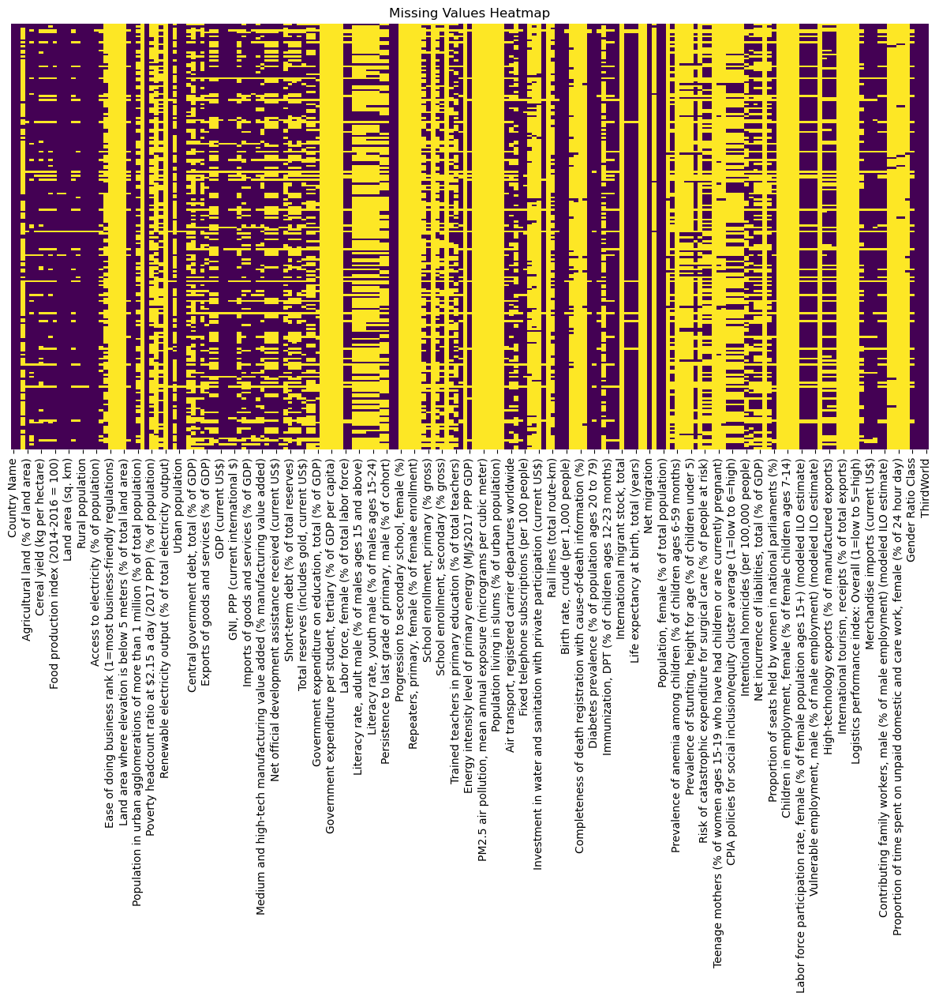

In [34]:
plt.figure(figsize=(15, 7))
sns.heatmap(orig_df.isna(), yticklabels=False, cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()

In [35]:
print((orig_df.isna().mean() * 100).to_string())

Country Name                                                                                                                                     0.000000
Year                                                                                                                                             0.000000
Agricultural irrigated land (% of total agricultural land)                                                                                      80.841121
Agricultural land (% of land area)                                                                                                               3.271028
Agriculture, forestry, and fishing, value added (% of GDP)                                                                                      11.682243
Arable land (% of land area)                                                                                                                     4.672897
Cereal yield (kg per hectare)                                               

In [36]:
threshold = 0.75
missing_ratio = orig_df.isna().mean()

drop_cols = missing_ratio[missing_ratio > threshold].index
new_df = orig_df.drop(columns=drop_cols)

In [37]:
num_cols = new_df.select_dtypes(include=['int64','float64']).columns
cat_cols = new_df.select_dtypes(include=['object','category']).columns

In [38]:
new_df[num_cols] = new_df[num_cols].fillna(new_df[num_cols].median())
new_df[cat_cols] = new_df[cat_cols].fillna("missing")

In [39]:
print((new_df.isna().mean() * 100).to_string())

Country Name                                                                                       0.0
Year                                                                                               0.0
Agricultural land (% of land area)                                                                 0.0
Agriculture, forestry, and fishing, value added (% of GDP)                                         0.0
Arable land (% of land area)                                                                       0.0
Cereal yield (kg per hectare)                                                                      0.0
Crop production index (2014-2016 = 100)                                                            0.0
Fertilizer consumption (kilograms per hectare of arable land)                                      0.0
Food production index (2014-2016 = 100)                                                            0.0
Forest area (% of land area)                                             

In [40]:
new_df.shape

(214, 130)

## Distributions

In [41]:
num_cols = new_df.select_dtypes(include=['int64', 'float64']).columns
cat_cols = new_df.select_dtypes(include=['object', 'category']).columns.union(['Gender Ratio Class'])

In [42]:
num_cols

Index(['Year', 'Agricultural land (% of land area)',
       'Agriculture, forestry, and fishing, value added (% of GDP)',
       'Arable land (% of land area)', 'Cereal yield (kg per hectare)',
       'Crop production index (2014-2016 = 100)',
       'Fertilizer consumption (kilograms per hectare of arable land)',
       'Food production index (2014-2016 = 100)',
       'Forest area (% of land area)', 'Forest area (sq. km)',
       ...
       'Fuel exports (% of merchandise exports)',
       'High-technology exports (% of manufactured exports)',
       'High-technology exports (current US$)',
       'Medium and high-tech exports (% manufactured exports)',
       'Merchandise exports (current US$)',
       'Merchandise imports (current US$)', 'Merchandise trade (% of GDP)',
       'Contributing family workers, female (% of female employment) (modeled ILO estimate)',
       'Contributing family workers, male (% of male employment) (modeled ILO estimate)',
       'Gender Ratio Class'],
  

In [43]:
cat_cols

Index(['Country Name', 'CountryName', 'Gender Ratio Class', 'Region',
       'ThirdWorld'],
      dtype='object')

In [44]:
new_df['Year'].value_counts()

Year
2021    214
Name: count, dtype: int64

In [45]:
num_cols = list(num_cols)
cat_cols = list(cat_cols)

num_cols.remove('Year')
cat_cols.append('Year')
cat_cols.remove('CountryName')

In [46]:
cat_cols

['Country Name', 'Gender Ratio Class', 'Region', 'ThirdWorld', 'Year']

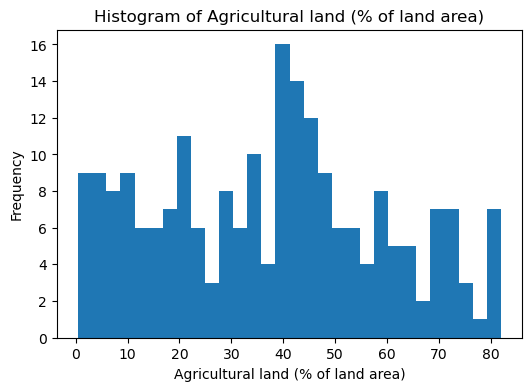

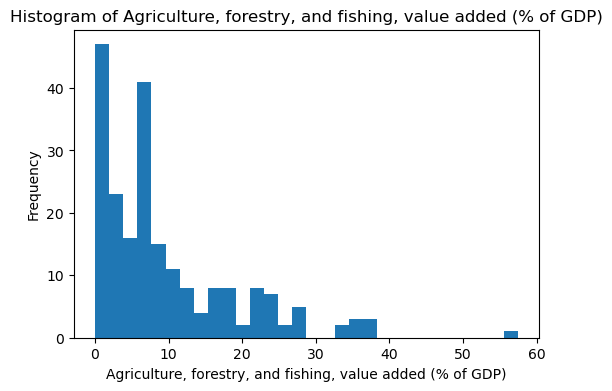

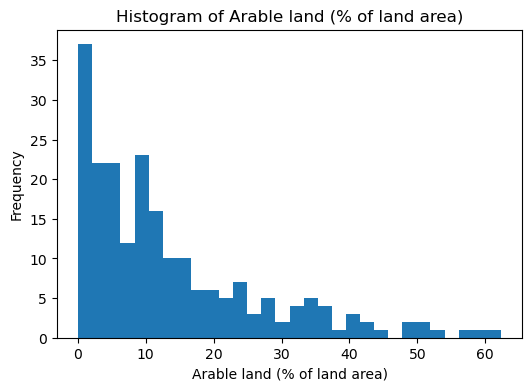

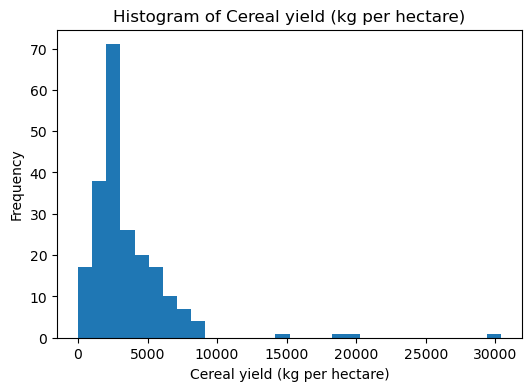

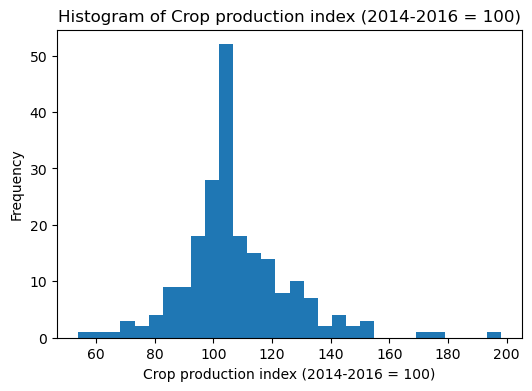

...

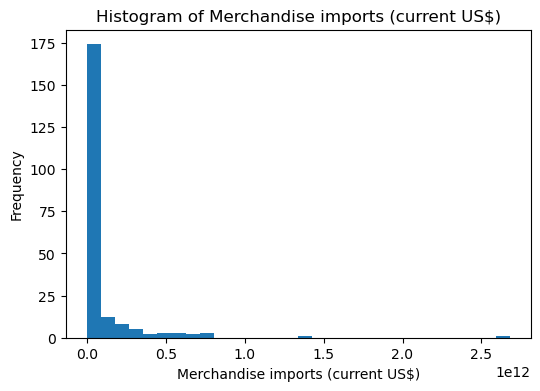

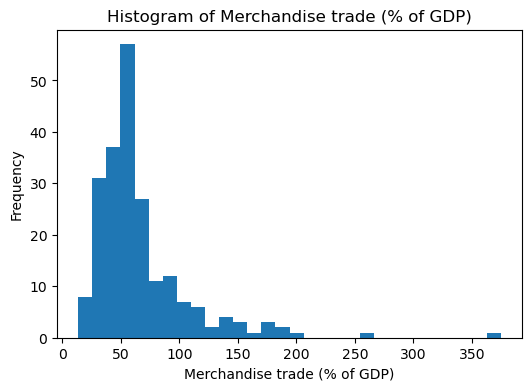

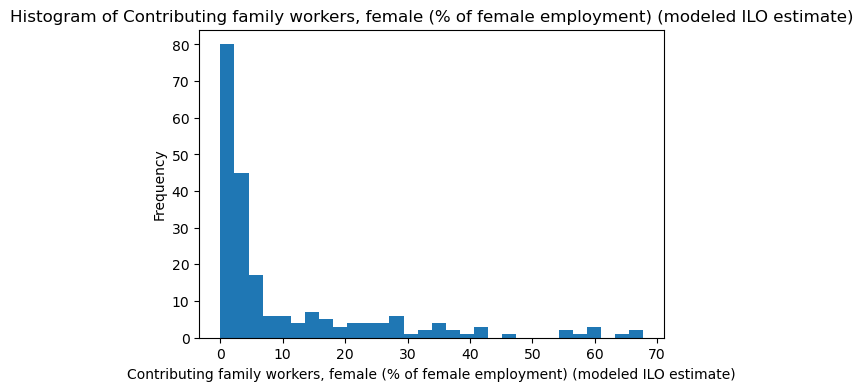

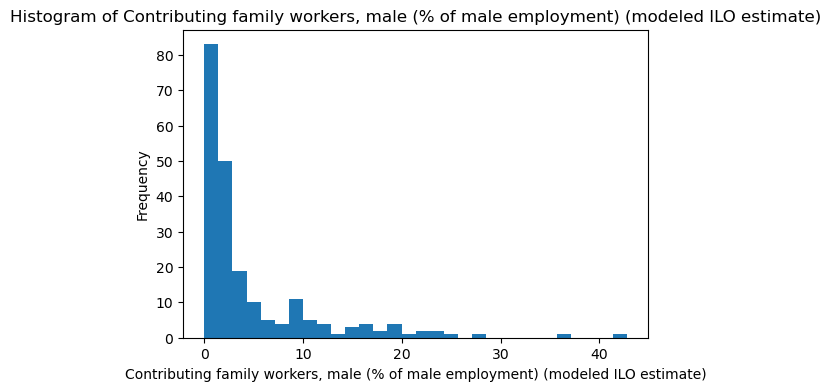

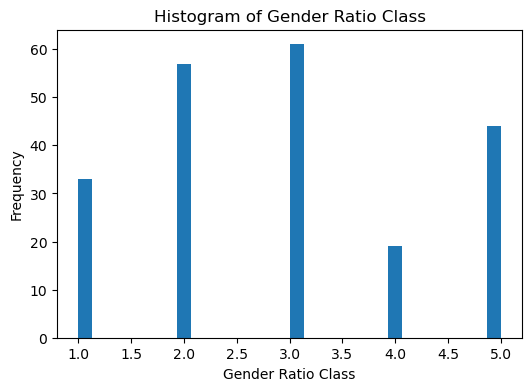

In [47]:
for col in num_cols:
    plt.figure(figsize=(6, 4))
    plt.hist(new_df[col].dropna(), bins=30)
    plt.title(f"Histogram of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

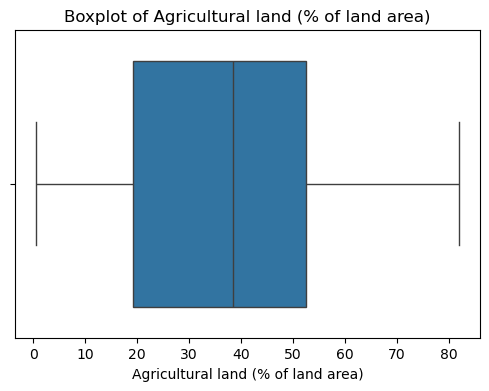

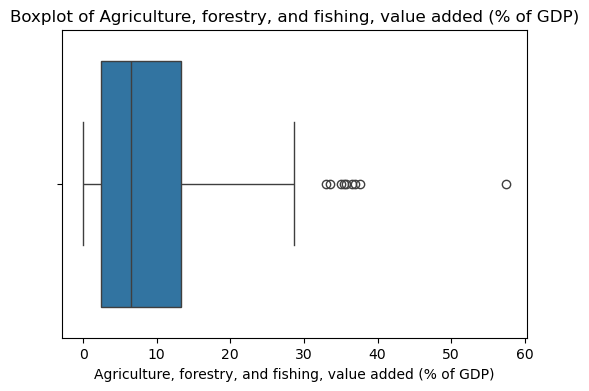

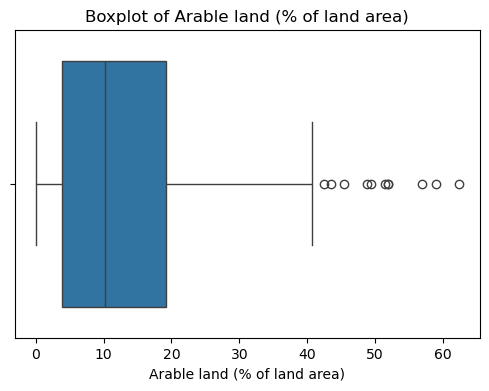

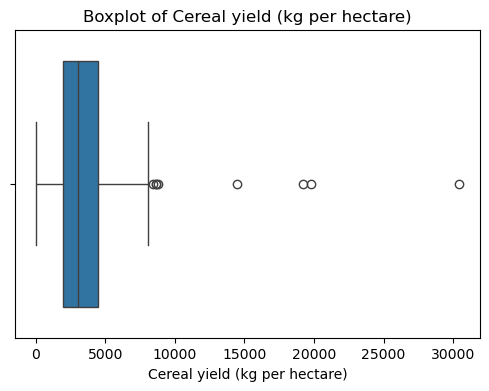

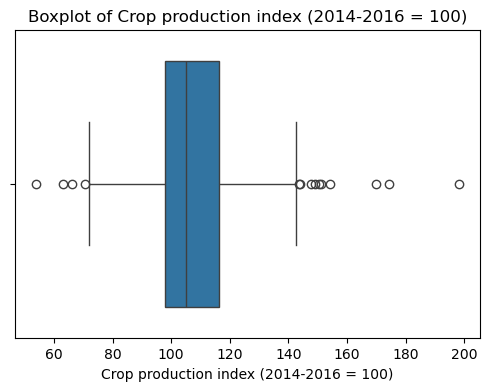

...

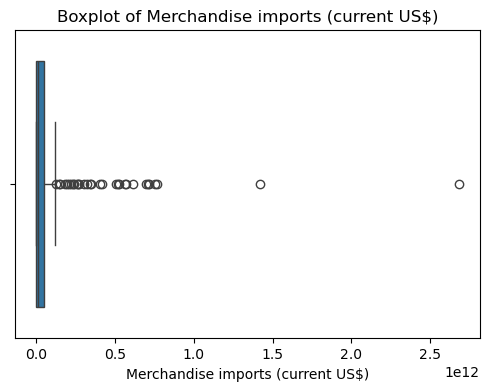

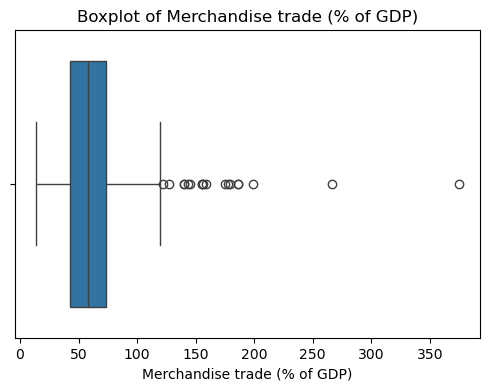

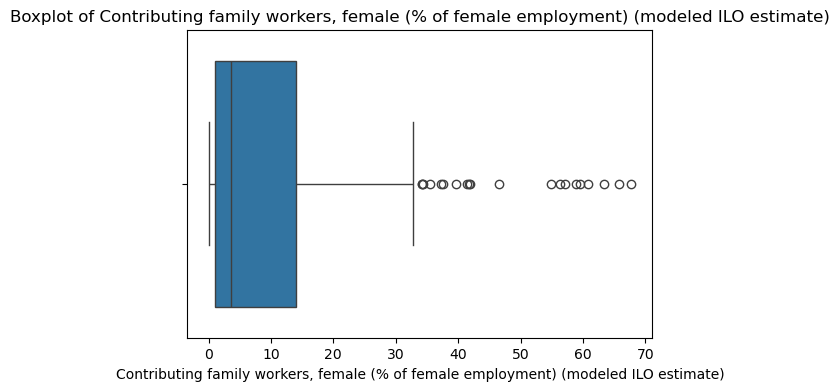

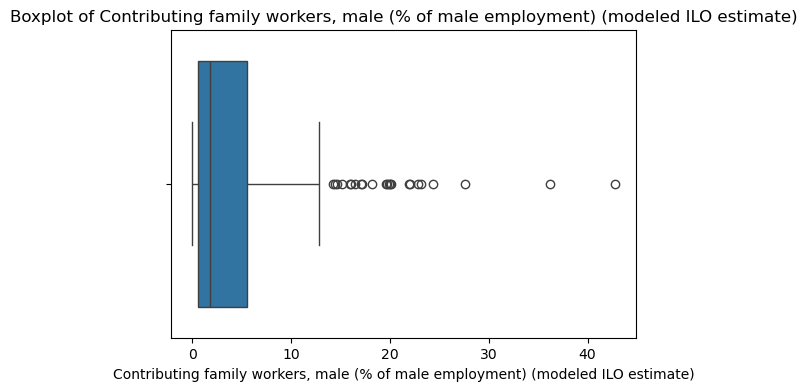

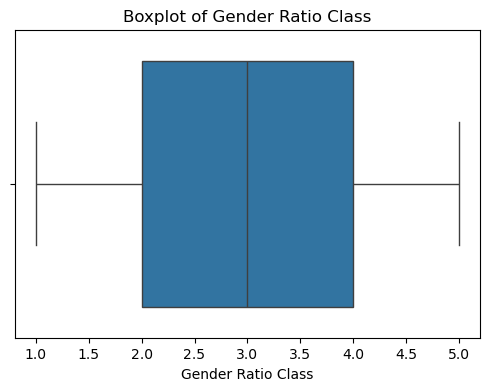

In [48]:
for col in num_cols:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=new_df[col])
    plt.title(f"Boxplot of {col}")
    plt.xlabel(col)
    plt.show()

In [49]:
print((new_df[num_cols].skew()).to_string())

Agricultural land (% of land area)                                                                  0.128174
Agriculture, forestry, and fishing, value added (% of GDP)                                          1.622772
Arable land (% of land area)                                                                        1.387223
Cereal yield (kg per hectare)                                                                       4.392225
Crop production index (2014-2016 = 100)                                                             0.973830
Fertilizer consumption (kilograms per hectare of arable land)                                       4.894049
Food production index (2014-2016 = 100)                                                             1.089349
Forest area (% of land area)                                                                        0.568545
Forest area (sq. km)                                                                                8.443604
Land area (sq. km) 

In [50]:
print((new_df[num_cols].kurtosis()).to_string())

Agricultural land (% of land area)                                                                  -0.910598
Agriculture, forestry, and fishing, value added (% of GDP)                                           3.159009
Arable land (% of land area)                                                                         1.501669
Cereal yield (kg per hectare)                                                                       29.561188
Crop production index (2014-2016 = 100)                                                              3.430535
Fertilizer consumption (kilograms per hectare of arable land)                                       28.928673
Food production index (2014-2016 = 100)                                                              3.387289
Forest area (% of land area)                                                                        -0.408706
Forest area (sq. km)                                                                                81.694020
Land area 

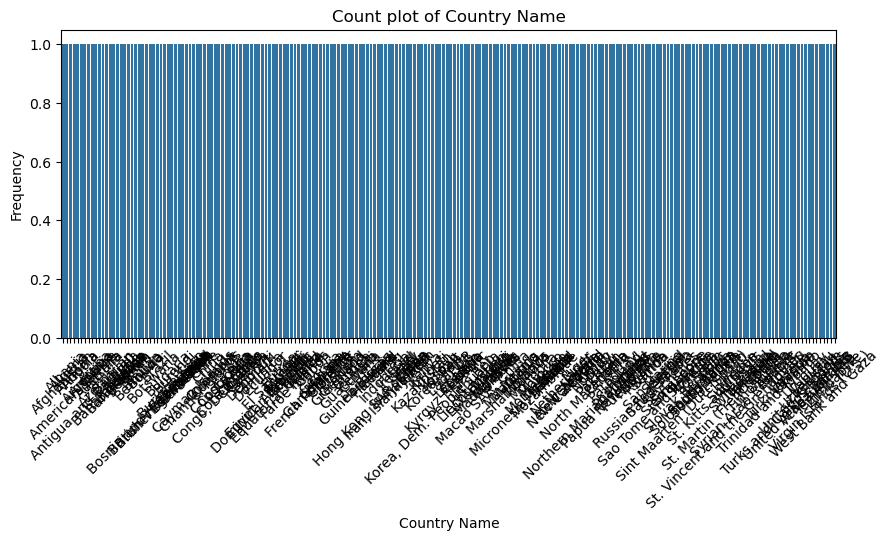

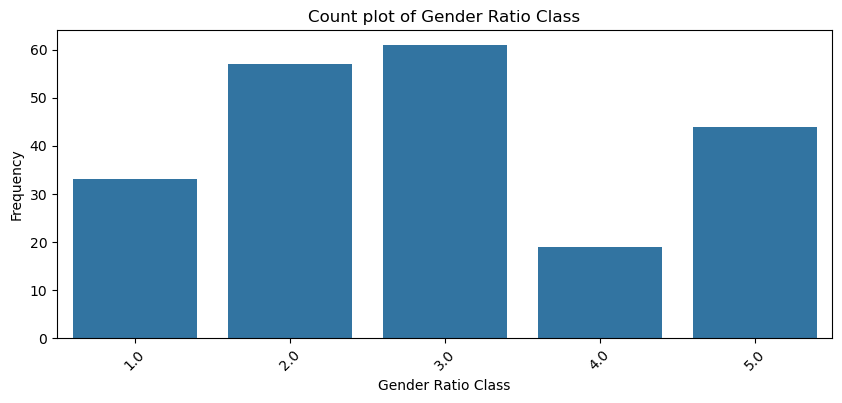

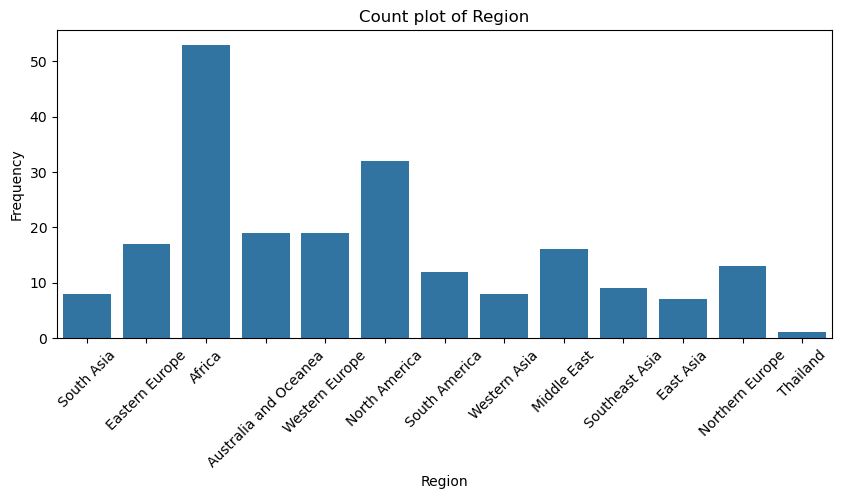

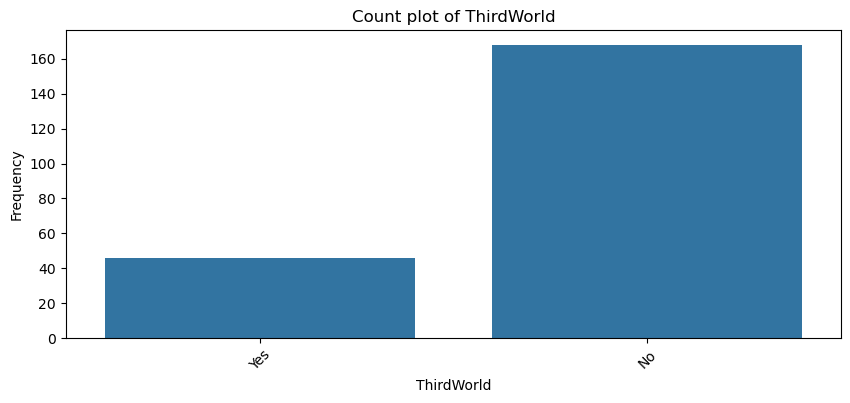

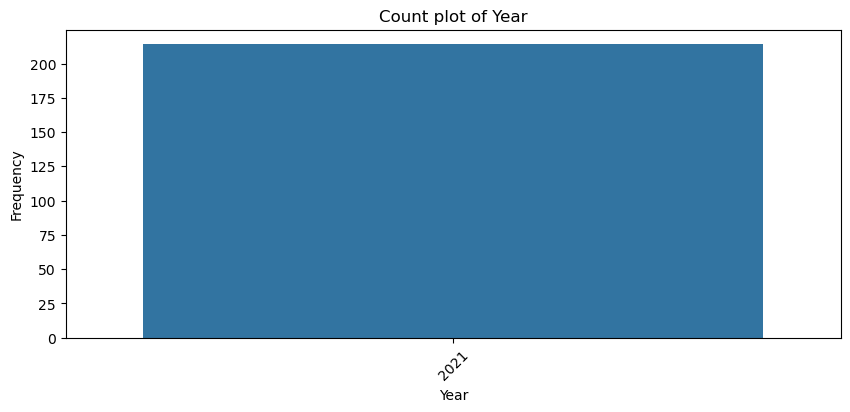

In [51]:
for col in cat_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(x=new_df[col])
    plt.title(f"Count plot of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.xticks(rotation=45)
    plt.show()

In [52]:
for col in cat_cols:
    print(new_df[col].value_counts()/len(new_df) * 100)

Country Name
Afghanistan    0.46729
Myanmar        0.46729
Nauru          0.46729
Nepal          0.46729
Netherlands    0.46729
                ...   
Gibraltar      0.46729
Greece         0.46729
Greenland      0.46729
Grenada        0.46729
Zimbabwe       0.46729
Name: count, Length: 214, dtype: float64
Gender Ratio Class
3.0    28.504673
2.0    26.635514
5.0    20.560748
1.0    15.420561
4.0     8.878505
Name: count, dtype: float64
Region
Africa                   24.766355
North America            14.953271
Australia and Oceanea     8.878505
Western Europe            8.878505
Eastern Europe            7.943925
Middle East               7.476636
Northern Europe           6.074766
South America             5.607477
Southeast Asia            4.205607
South Asia                3.738318
Western Asia              3.738318
East Asia                 3.271028
Thailand                  0.467290
Name: count, dtype: float64
ThirdWorld
No     78.504673
Yes    21.495327
Name: count, dtype: float6

## Average and Standard deviation

In [53]:
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

new_df[num_cols].describe()

,Agricultural land (% of land area),"Agriculture, forestry, and fishing, value added (% of GDP)",Arable land (% of land area),Cereal yield (kg per hectare),Crop production index (2014-2016 = 100),Fertilizer consumption (kilograms per hectare of arable land),Food production index (2014-2016 = 100),Forest area (% of land area),Forest area (sq. km),Land area (sq. km),Livestock production index (2014-2016 = 100),Permanent cropland (% of land area),Rural population,Rural population (% of total population),Surface area (sq. km),Access to electricity (% of population),"Annual freshwater withdrawals, total (% of internal resources)",CPIA public sector management and institutions cluster average (1=low to 6=high),"Mortality rate, under-5 (per 1,000 live births)",Population growth (annual %),Population in urban agglomerations of more than 1 million (% of total population),"Population, total",Poverty headcount ratio at $2.15 a day (2017 PPP) (% of population),"Primary completion rate, total (% of relevant age group)",Renewable energy consumption (% of total final energy consumption),"School enrollment, primary and secondary (gross), gender parity index (GPI)",Urban population,Urban population (% of total population),"Adjusted net savings, including particulate emission damage (% of GNI)","Central government debt, total (% of GDP)","Current account balance (BoP, current US$)",Expense (% of GDP),Exports of goods and services (% of GDP),External debt stocks (% of GNI),"External debt stocks, total (DOD, current US$)",GDP (current US$),GDP growth (annual %),"GNI per capita, PPP (current international $)","GNI, PPP (current international $)","Grants, excluding technical cooperation (BoP, current US$)",Gross savings (% of GDP),Imports of goods and services (% of GDP),"Industry (including construction), value added (% of GDP)","Inflation, consumer prices (annual %)",Medium and high-tech manufacturing value added (% manufacturing value added),Net ODA received (% of GNI),Net ODA received per capita (current US$),Net official development assistance received (current US$),Price level ratio of PPP conversion factor (GDP) to market exchange rate,"Revenue, excluding grants (% of GDP)",Short-term debt (% of total reserves),"Technical cooperation grants (BoP, current US$)","Total debt service (% of exports of goods, services and primary income)","Total reserves (includes gold, current US$)","Children out of school, primary, female","Children out of school, primary, male","Government expenditure on education, total (% of GDP)","Labor force, female (% of total labor force)","Labor force, total","Literacy rate, youth female (% of females ages 15-24)","Literacy rate, youth male (% of males ages 15-24)","Literacy rate, youth total (% of people ages 15-24)","Persistence to last grade of primary, female (% of cohort)","Persistence to last grade of primary, male (% of cohort)",Population ages 0-14 (% of total population),Population ages 15-64 (% of total population),"School enrollment, preprimary (% gross)","School enrollment, primary (% gross)","School enrollment, primary (gross), gender parity index (GPI)","School enrollment, secondary (% gross)","School enrollment, tertiary (% gross)",Trained teachers in primary education (% of total teachers),"Unemployment, total (% of total labor force) (modeled ILO estimate)",Energy intensity level of primary energy (MJ/$2017 PPP GDP),"Renewable internal freshwater resources, total (billion cubic meters)","Air transport, registered carrier departures worldwide",Container port traffic (TEU: 20 foot equivalent units),Fixed broadband subscriptions (per 100 people),Fixed telephone subscriptions (per 100 people),Mobile cellular subscriptions (per 100 people),Rail lines (total route-km),Secure Internet servers (per 1 million people),Age dependency ratio (% of working-age population),"Birth rate, crude (per 1,000 people)","Death rate, crude (per 1,000 people)",Diabetes prevalence (% of population ages 20 to 79),"Fertility rate, t

## Interaction between data

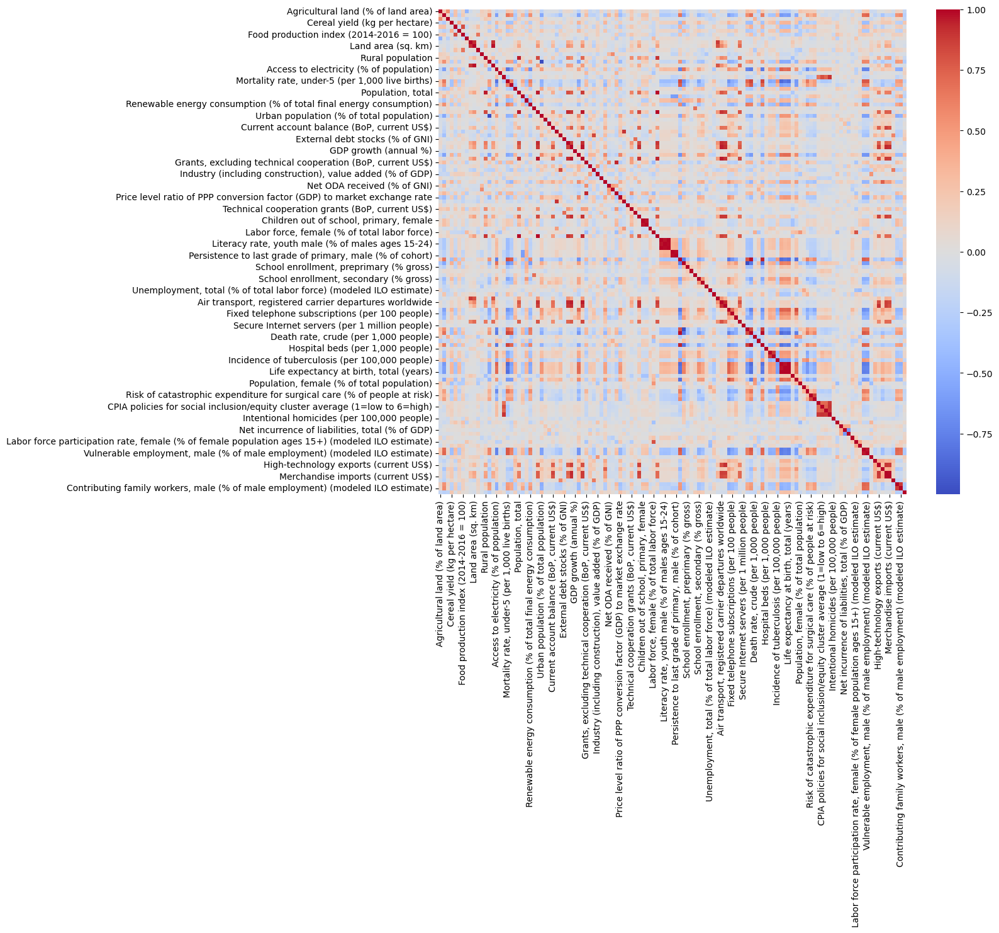

In [54]:
corr = new_df[num_cols].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr, cmap='coolwarm', center=0)
plt.show()

In [55]:
corr = new_df[num_cols].corrwith(new_df['Gender Ratio Class']).sort_values(key=abs, ascending=False)
corr.head(15)

Gender Ratio Class                                                                     1.000000
GNI per capita, PPP (current international $)                                          0.306790
Vulnerable employment, male (% of male employment) (modeled ILO estimate)             -0.298792
Vulnerable employment, female (% of female employment) (modeled ILO estimate)         -0.298115
Price level ratio of PPP conversion factor (GDP) to market exchange rate               0.286666
Life expectancy at birth, male (years)                                                 0.280094
Contributing family workers, female (% of female employment) (modeled ILO estimate)   -0.277584
Rural population (% of total population)                                              -0.272874
Urban population (% of total population)                                               0.272862
Life expectancy at birth, total (years)                                                0.272645
Contributing family workers, male (% of 

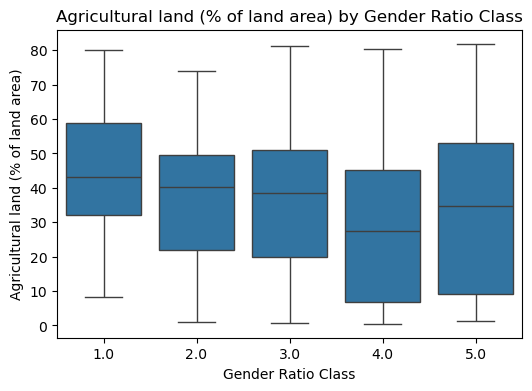

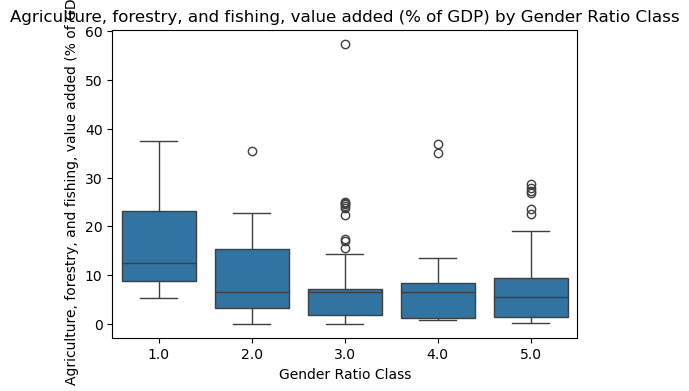

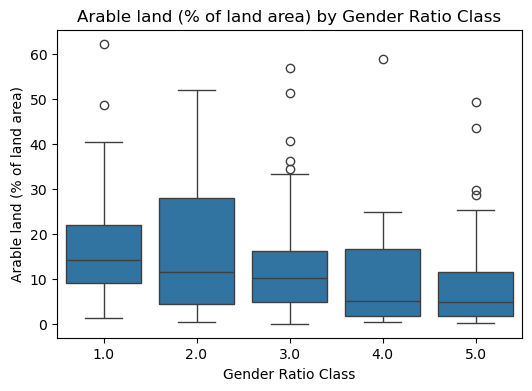

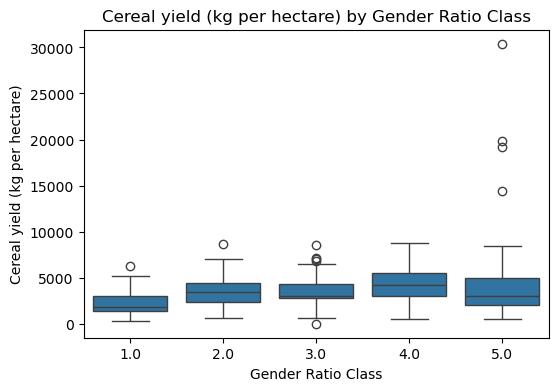

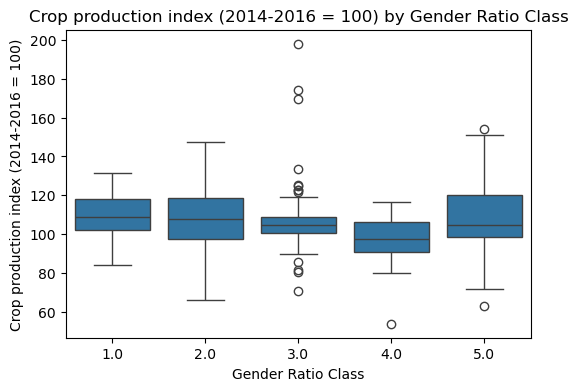

...

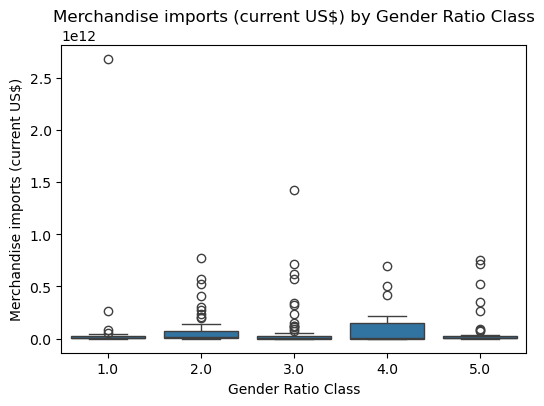

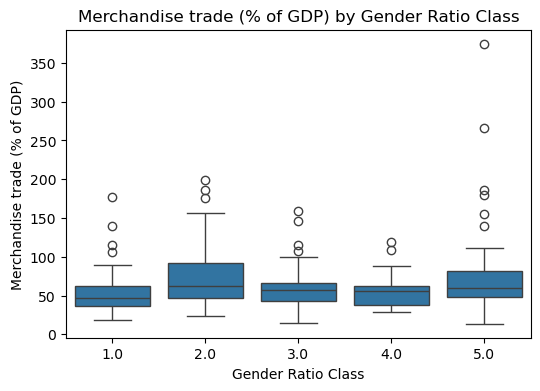

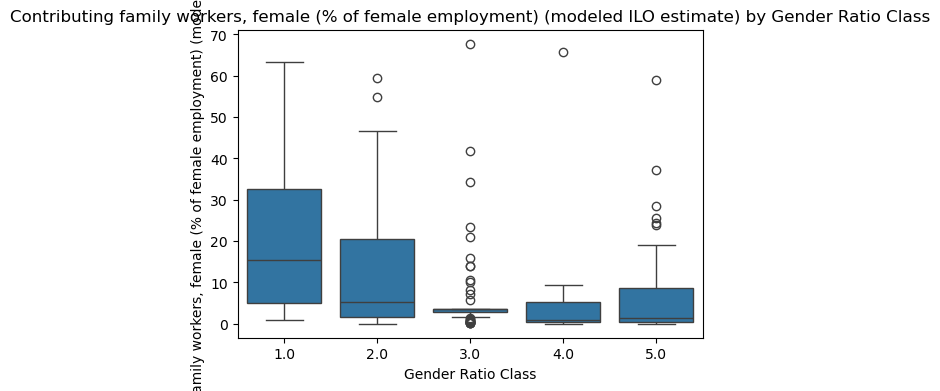

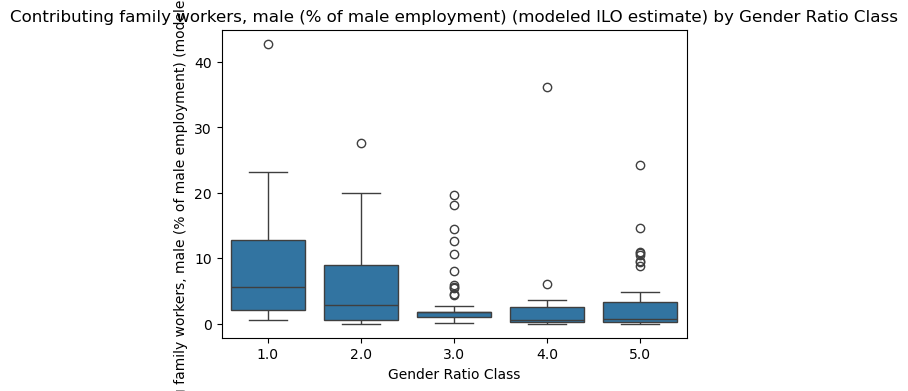

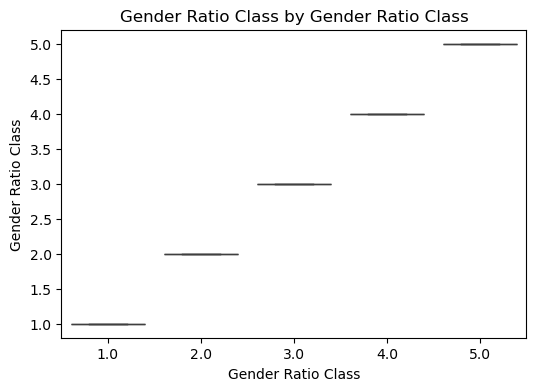

In [63]:
target = 'Gender Ratio Class'

for col in num_cols:
    plt.figure(figsize=(6,4))
    sns.boxplot(x=target, y=col, data=new_df)
    plt.title(f'{col} by {target}')
    plt.show()

In [56]:
from scipy.stats import chi2_contingency

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    r, k = confusion_matrix.shape
    return np.sqrt(chi2 / (n * (min(k - 1, r - 1))))

C:\Users\66959\AppData\Local\Temp\ipykernel_11828\3692707369.py:8: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (min(k - 1, r - 1))))
C:\Users\66959\AppData\Local\Temp\ipykernel_11828\3692707369.py:8: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (min(k - 1, r - 1))))
C:\Users\66959\AppData\Local\Temp\ipykernel_11828\3692707369.py:8: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (min(k - 1, r - 1))))
C:\Users\66959\AppData\Local\Temp\ipykernel_11828\3692707369.py:8: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (min(k - 1, r - 1))))
C:\Users\66959\AppData\Local\Temp\ipykernel_11828\3692707369.py:8: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (min(k - 1, r - 1))))
C:\Users\66959\AppData\Local\Temp\ipykernel_11828\3692707369.py:8: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (m

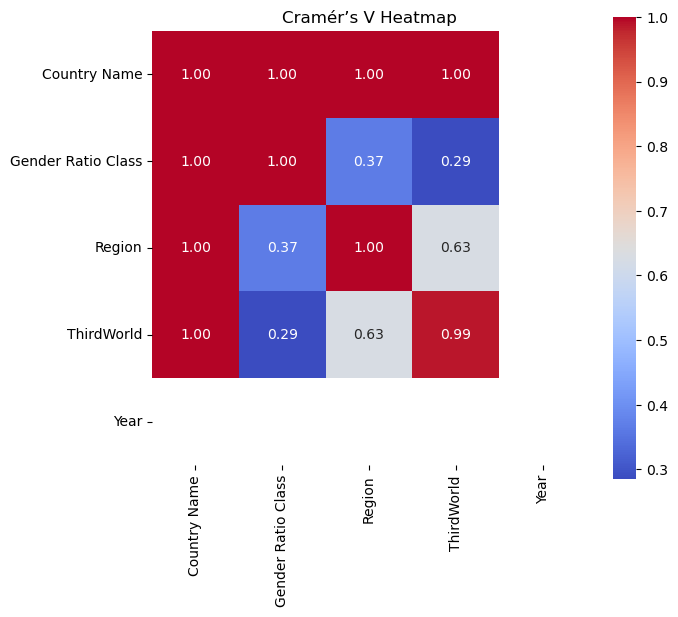

In [57]:
def cramer_matrix(df):
    cols = df.columns
    
    cramer_matrix = pd.DataFrame(index=cols, columns=cols, dtype=float)
    
    for c1 in cols:
        for c2 in cols:
            cramer_matrix.loc[c1, c2] = cramers_v(df[c1], df[c2])
    
    return cramer_matrix

cat_df = new_df[cat_cols]
cramer_matrix = cramer_matrix(cat_df)

plt.figure(figsize=(7,6))
sns.heatmap(cramer_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Cramér’s V Heatmap")
plt.show()

In [58]:
def conditional_entropy(x, y):
    # Joint distribution P(x, y)
    xy = pd.crosstab(x, y, normalize="all")

    # Marginal distribution P(y)
    py = xy.sum(axis=0)

    # Conditional distribution P(x|y)
    p_x_given_y = xy.div(py, axis=1)

    # H(X|Y) = sum_y P(y) * H(X|Y=y) 
    entropy = -np.nansum(py * (p_x_given_y * np.log2(p_x_given_y)).sum(axis=0))
    return entropy


def entropy(x):
    p = x.value_counts(normalize=True)
    return -np.sum(p * np.log2(p))


def theils_u(x, y):
    h_x = entropy(x)
    h_x_given_y = conditional_entropy(x, y)

    if h_x == 0:
        return 1.0  # X has no uncertainty at all

    return (h_x - h_x_given_y) / h_x

C:\Users\66959\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:395: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
C:\Users\66959\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:395: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
C:\Users\66959\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:395: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
C:\Users\66959\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:395: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
C:\Users\66959\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:395: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
C:\Users\66959\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:395: RuntimeWarning: divide by zero encountered in log2
  result = func(sel

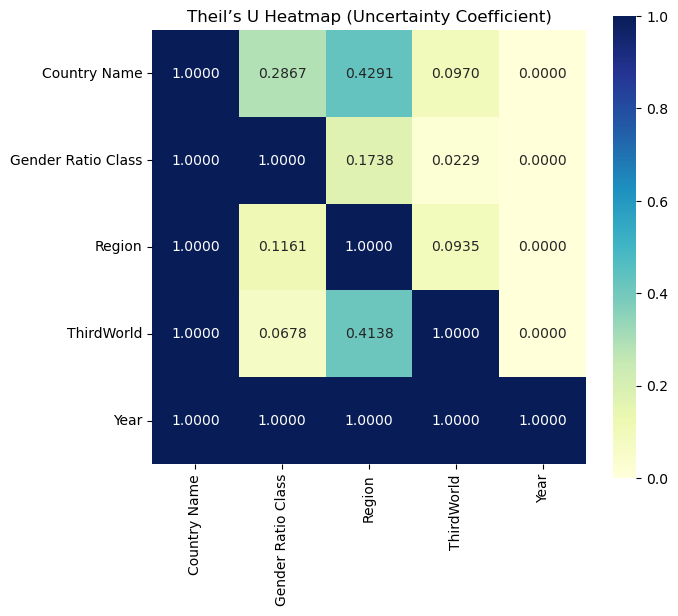

In [59]:
def theils_u_matrix(df):
    cols = df.columns
    matrix = pd.DataFrame(index=cols, columns=cols)
    
    for c1 in cols:
        for c2 in cols:
            matrix.loc[c1, c2] = theils_u(df[c1], df[c2])
    
    return matrix.astype(float)

cat_df = new_df[cat_cols]
u_matrix = theils_u_matrix(cat_df)
#u_matrix_sorted = u_matrix.sort_values(by=u_matrix.index.tolist(), axis=1)

# Plot heatmap
plt.figure(figsize=(7,6))
#sns.heatmap(u_matrix_sorted, annot=True, cmap="YlGnBu")
sns.heatmap(u_matrix, annot=True, cmap="YlGnBu", fmt=".4f", square=True)
plt.title("Theil’s U Heatmap (Uncertainty Coefficient)")
plt.show()

In [65]:
from scipy.stats import chi2_contingency

target = 'Gender Ratio Class'

results = []

for col in cat_cols:
    contingency = pd.crosstab(new_df[col], new_df[target])
    
    if contingency.shape[0] > 1 and contingency.shape[1] > 1:
        chi2, p, dof, expected = chi2_contingency(contingency)
        results.append({
            'feature': col,
            'chi2': chi2,
            'dof': dof,
            'p_value': p
        })

chi_df = pd.DataFrame(results).sort_values('p_value')
chi_df

,feature,chi2,dof,p_value
1,Gender Ratio Class,856.000000,16,7.027198e-172
2,Region,114.547057,48,2.302165e-07
3,ThirdWorld,17.382332,4,1.628736e-03
0,Country Name,856.000000,852,4.550574e-01
